<a href="https://colab.research.google.com/github/leoUninova/Batch-TA-SI-/blob/master/250_tasi_bubble_report_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [2]:
#@title Install packagages to read czi files 
pip install -q czifile

     |████████████████████████████████| 133kB 7.5MB/s 


In [0]:
#@title import packaged 
import pandas as pd
from czifile import CziFile
import os 
import glob
from matplotlib import pylab
import matplotlib.pyplot as plt
from google.colab import widgets


In [0]:
#@title mount sheet 
from google.colab import auth
auth.authenticate_user()

import gspread
from oauth2client.client import GoogleCredentials

gc = gspread.authorize(GoogleCredentials.get_application_default())

In [5]:
#@title drive mount
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
#@title sheet list/ display tables
def sheet_list(name): 
  listOfdf=[]
  listOfStr=[]
  sh = gc.open(name)
  for i in range (len(sh.worksheets())):
    worksheet=sh.get_worksheet(i)
    rows = worksheet.get_all_values()
    headers = rows.pop(0)
    df = pd.DataFrame(rows, columns=headers)
    listOfdf.append(df)
    listOfStr.append(sh.get_worksheet(i).title)
  zipbObj = zip(listOfStr, listOfdf)
  dictOfWords = dict(zipbObj)
  return dictOfWords

def DisplayTables(dfdict):
  tb = widgets.TabBar(list(dfdict.keys()))
  for i, values in enumerate (dfdict.values()):
    with tb.output_to(i, select=(i < 1)):
      display(values)
      
      
      
      
def dicfordf (files):
  '''
  Takes a list of files, splits them on the first "-".
  Creates a dictioanry with the number as key and name as value. 
  When a key has been alreayd used, it appends.
  Creates a dataframe, sorts the collumns making then integers. 
  Returns the transpose of the dataframe.
  '''
  new_dict = {}
  for idx, file in enumerate(files):
    number, name = file.split('-',1)
    if number in new_dict:
        new_dict[number].append(file)
    else:
        new_dict[number] = [file] 
  df=pd.DataFrame.from_dict(new_dict, orient='index')
  return (df.T)

def ImageTabFromdf(data):
  '''
  Takes a dataframe. 
  uses collumns as tab names. 
  Iterates over tab and creates tb2 subplots
  takes the filename and plots it czi . 
  '''  
  
  tb = widgets.TabBar(list(data.columns))
  for i, k in enumerate(list(data.columns)):
    with tb.output_to(i, select=(i < 1)):
      wid1=list(df[k].dropna())
      tb2 = widgets.TabBar(wid1, location='start') 
      for w in range(len(wid1)):
        with tb2.output_to(wid1[w],  select=(i < 1)):
          file=wid1[w]#str(k)+'-'+ str(wid1[w])
          with CziFile(file) as czi: #get image as array from czi format
               image_arrays = czi.asarray()
          images=image_arrays[0] 
          fig, ax = plt.subplots(figsize=(12, 8))
          ax.imshow(images)
          pylab.show()


#Report : 
## General notes

* All samples have some bubbles 
* Sample 5-6 (Ta-SI) have markeadly less
* No difference between heating processes 

Probably  the silicon in contact with the substrate is causing issues. Sample 5-6 are TASI strucutre, and have less of this issue. Sample 5 had some dirt visible from the gate onwards, but no much formation of bubbles occured. No marked differences between the 2 temperatures. 




In [7]:
#@title table of process
sh = gc.open("TASI BACTH")
worksheet_list = sh.worksheets()

#create dictioanry with dataframe of sheets, keys are the names of the sheets 
tabledic=sheet_list("tasi 2 (6tr)")
DisplayTables(tabledic)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

,sample,preheat,post,exposure,dev,status
0,1-6,"90, 60","110, 60",s-7,45sec+-,good all
1,,,,,,
2,Die-deposition,,,,,
3,sample,´deposition,time,growth,Thickness,Notes
4,1-4,SiO2,20,"0,9",18,opened between layers
5,1-6,Ta2O5,136,"1,57","213,52",
6,3-6,SiO2,20,"0,9",18,
7,,,,,"249,52",
8,,,,,,
9,,,,,,


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

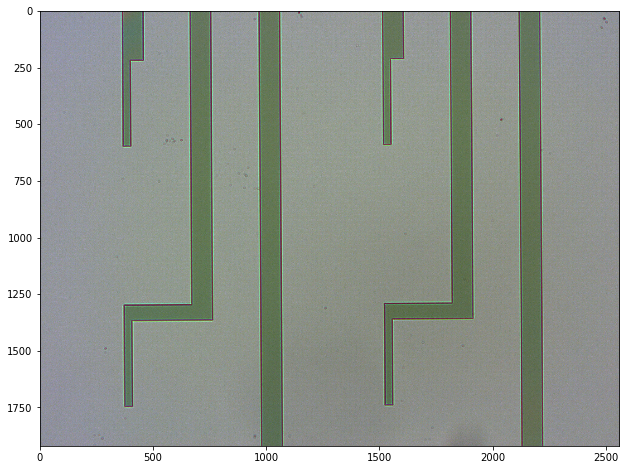

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

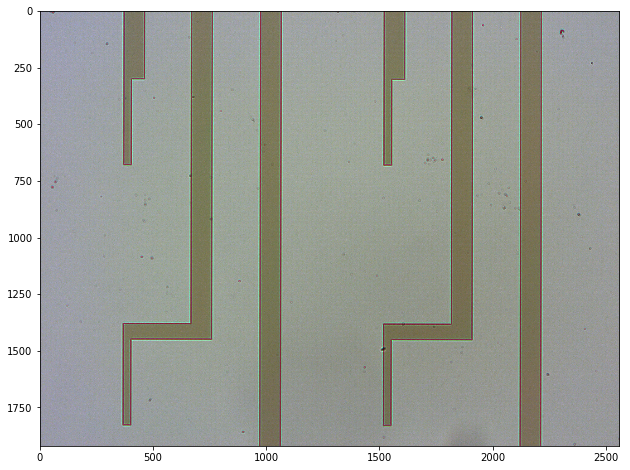

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

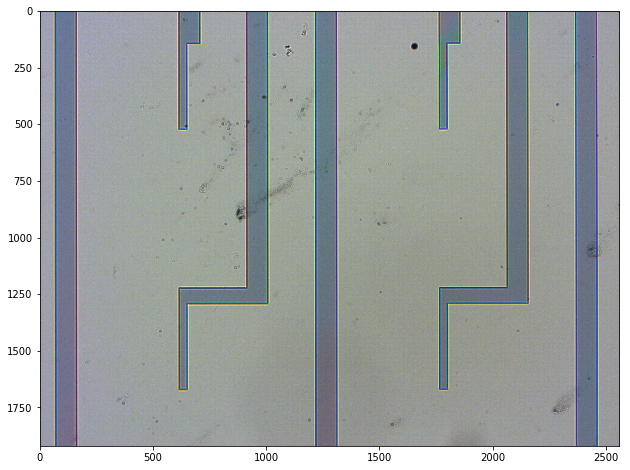

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

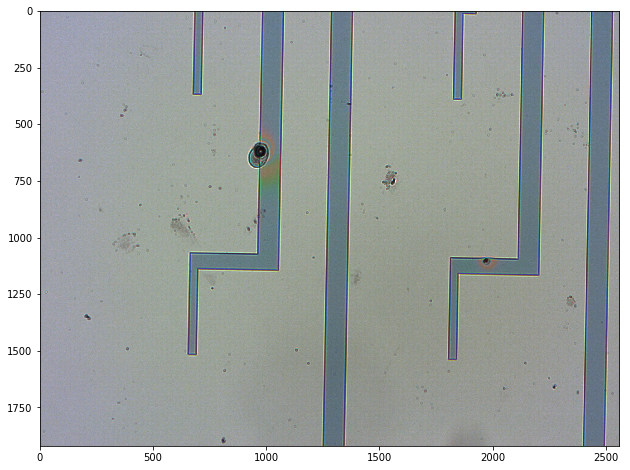

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

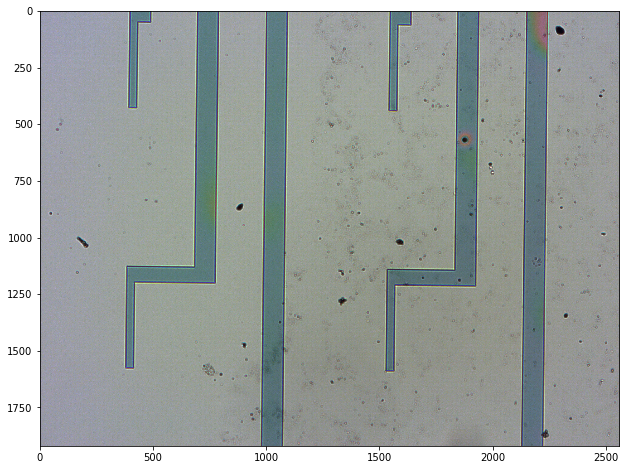

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

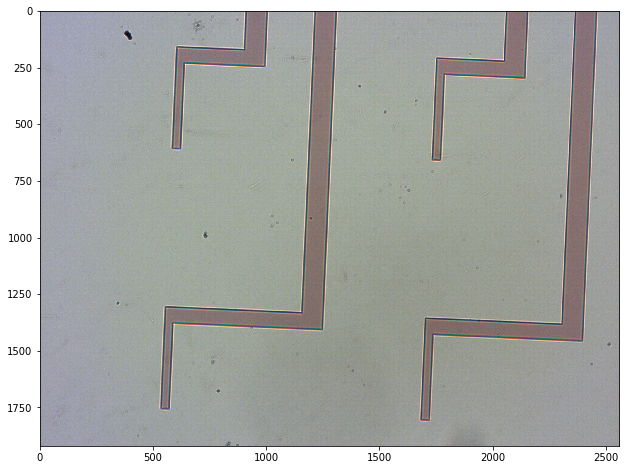

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [8]:
#@title Gate photoresit
os.chdir('/content/drive/My Drive/Images-microsope/third/gate photoresist')
images_files= glob.glob('*.czi') 

df=pd.DataFrame(images_files)
df=df.T
df.columns=list(images_files)

ImageTabFromdf(df)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

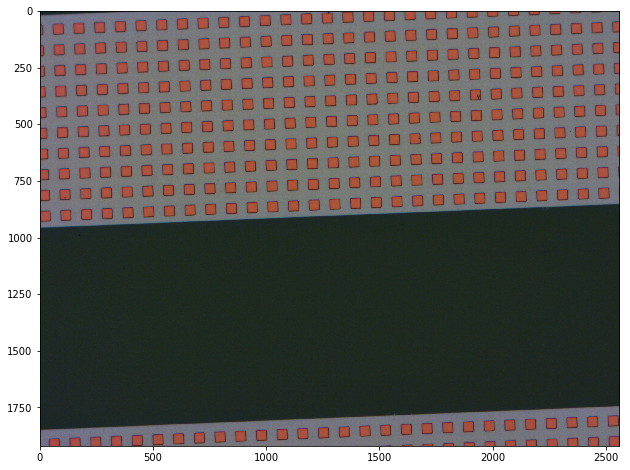

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

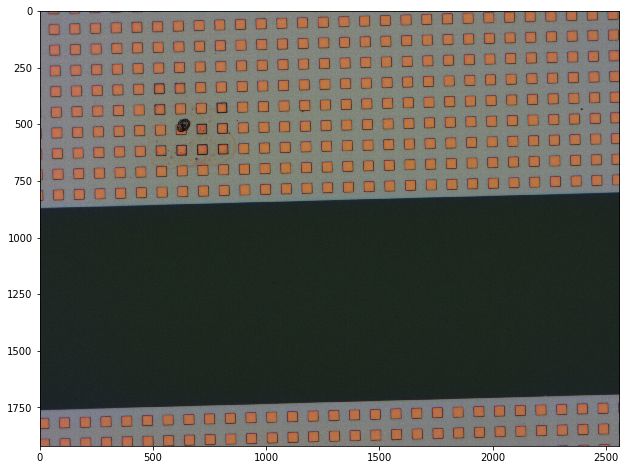

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

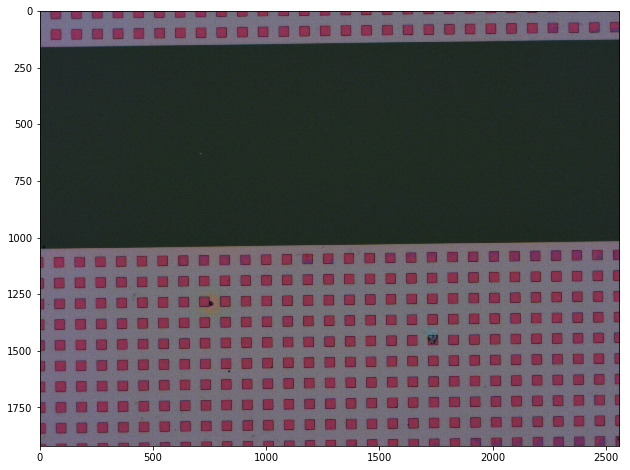

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

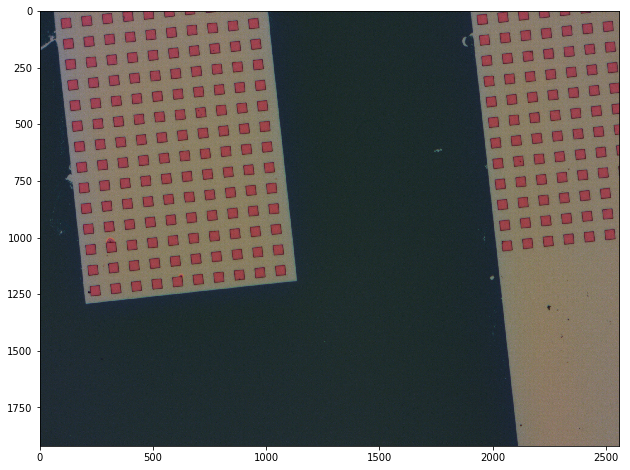

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

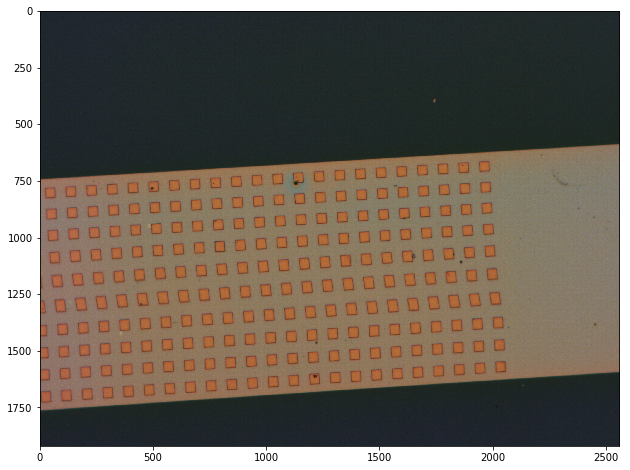

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

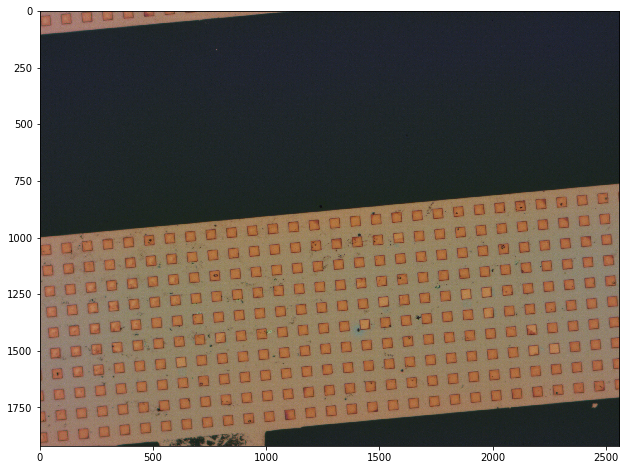

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [9]:
#@title Dielectric Photoresit
os.chdir('/content/drive/My Drive/Images-microsope/third/die photoresit')
images_files= glob.glob('*.czi') 

df=pd.DataFrame(images_files)
df=df.T
df.columns=list(images_files)

ImageTabFromdf(df)



>sample | Structure | temperature 
>--- | --- | --- 
>1 | SiTa | 300  
>2 | SiTa | 180  
>3 | SiTaSi| 300  
>4 | SiTaSi | 180  
>5 | TaSi | 300  
>6 | TaSi | 180 





<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

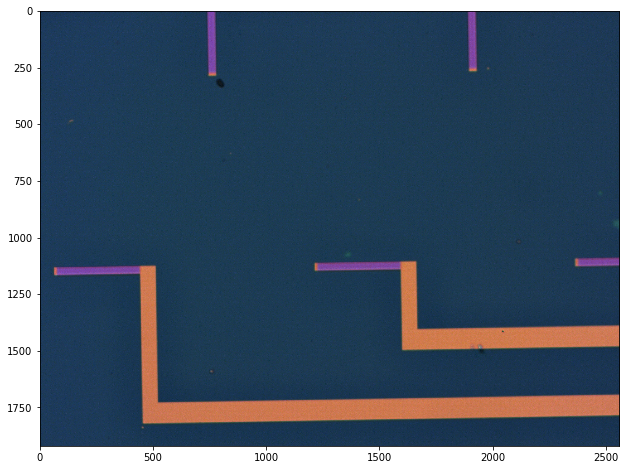

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

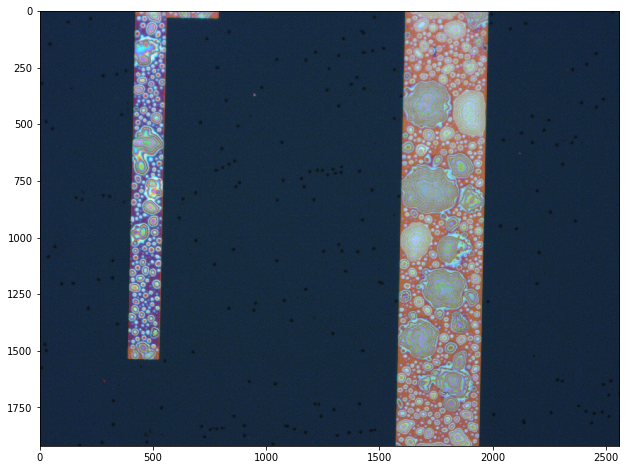

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

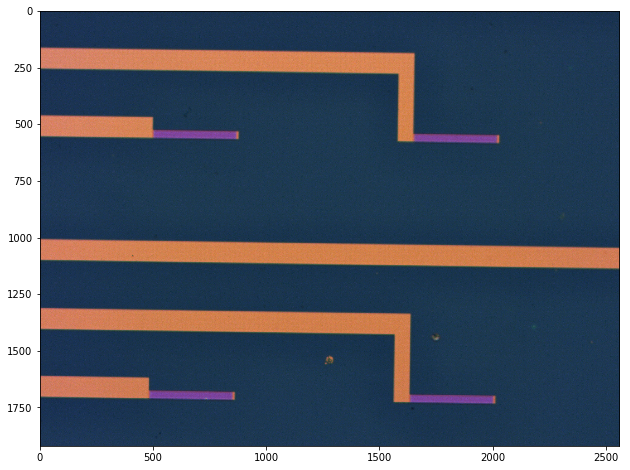

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [0]:
#@title Images postbake results



os.chdir('/content/drive/My Drive/Images-microsope/third/semi etched cleaned')
images_files= glob.glob('*.czi') 
df=dicfordf(images_files)  
ImageTabFromdf(df)


#Next steps.

##The issues could be in either: 
* Not heating the substrate after cleaning the corning glass 
* Photoresist residuals left after cleaning the gate 
* Between the contact of SIO2 and Molibdenum 
*  With the opening and closing of the vaccuum chamber (dielectric) 
*  With Processs 'lift off' 


##Samples to be produced 

* Use heating after glass is cleaned. 
* Sample [mo(60nm)-SiO2(18nm)]  deposited toghether-etched-heated 
* Normal sample [Mo-Ta2O5] -heated 
* Do a sample without liftoff- (opposite photoresit) -heated


In [0]:
#@title setup plots
import pandas as pd 
url='https://raw.githubusercontent.com/leoUninova/Batch-TA-SI-/master/TASIone250.csv'
df= pd.read_csv(url)
df.Sample=df.Sample.astype(str)
df.number = df.number.astype(str)
five=df.loc[df.Sample=='5']
six=df.loc[df.Sample=='6']

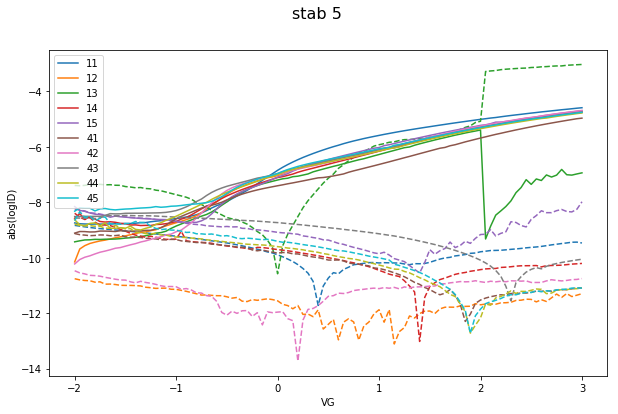

In [28]:
#@title 250:300 All tranistors leak

import matplotlib.pyplot as plt
import numpy as np
fig, ax = plt.subplots(figsize=(10, 6))
fig.suptitle('stab 5 ', fontsize=16)  
ax.set_ylabel('abs(logID)')
ax.set_xlabel('VG')

for key, grp in five.groupby(['number']): 
  y=np.log10(grp.absID)
  x=grp.VG
  y2=np.log10(grp.absIG)

  color = next(ax._get_lines.prop_cycler)['color']

  ax.plot(x,  y,  label=key, color=color)
  ax.plot(x, y2, label='',  color =color, linestyle='--')

plt.legend(loc='best')

plt.show() 

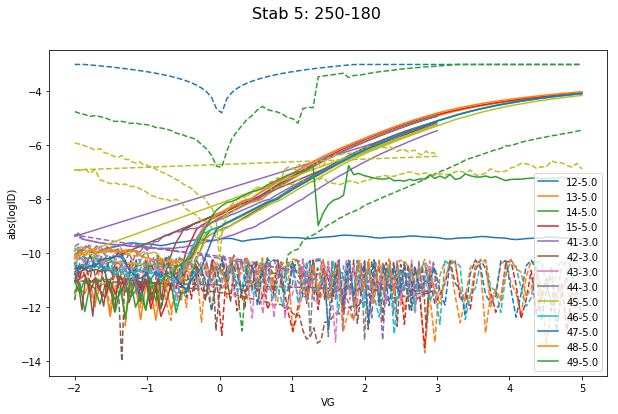

In [41]:
#@title 250-180
fig, ax = plt.subplots(figsize=(10, 6))
fig.suptitle('Stab 5: 250-180 ', fontsize=16)  
ax.set_ylabel('abs(logID)')
ax.set_xlabel('VG')
stab=six.loc[six.Curve=='stab']

for key, grp in stab.groupby(['number']): 
  y=np.log10(grp.absID)
  x=grp.VG
  y2=np.log10(grp.absIG)

  color = next(ax._get_lines.prop_cycler)['color']

  ax.plot(x,  y,  label=key+'-'+ str(max(x)), color=color)
  ax.plot(x, y2, label='',  color =color, linestyle='--')

plt.legend(loc='best')

plt.show() 

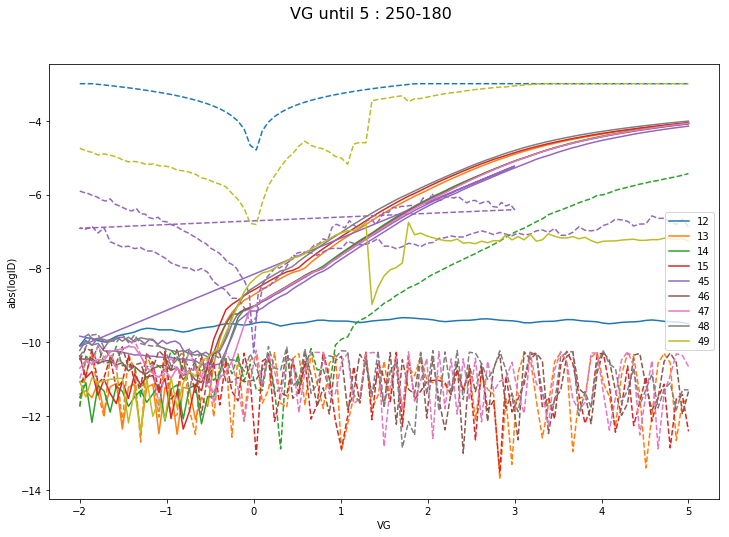

In [39]:
#@title VG up to 5 
fig, ax = plt.subplots(figsize=(12, 8))
fig.suptitle('VG until 5 : 250-180 ', fontsize=16)  
ax.set_ylabel('abs(logID)')
ax.set_xlabel('VG')
stab=six.loc[six.Curve=='stab']
for key, grp in stab.groupby(['number']): 
  y=np.log10(grp.absID)
  x=grp.VG
  y2=np.log10(grp.absIG)
  if max(x)<4:
    continue
    
  color = next(ax._get_lines.prop_cycler)['color']

  ax.plot(x,  y,  label=key, color=color)
  ax.plot(x, y2, label='',  color =color, linestyle='--')

plt.legend(loc='best')

plt.show() 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':


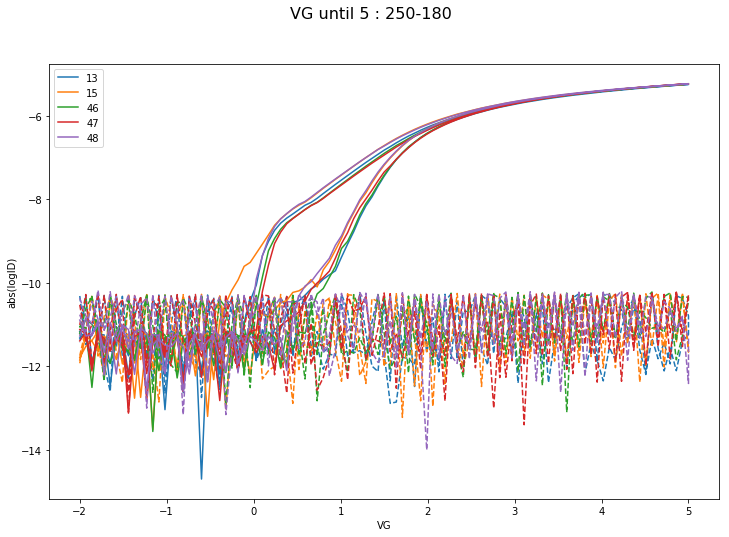

In [42]:
#@title Linear max(VG)=5
fig, ax = plt.subplots(figsize=(12, 8))
fig.suptitle('VG until 5 : 250-180 ', fontsize=16)  
ax.set_ylabel('abs(logID)')
ax.set_xlabel('VG')
stab=six.loc[six.Curve=='lin']
for key, grp in stab.groupby(['number']): 
  y=np.log10(grp.absID)
  x=grp.VG
  y2=np.log10(grp.absIG)
  if max(x)<4:
    continue
    
  color = next(ax._get_lines.prop_cycler)['color']

  ax.plot(x,  y,  label=key, color=color)
  ax.plot(x, y2, label='',  color =color, linestyle='--')

plt.legend(loc='best')

plt.show() 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in log10
  if __name__ == '__main__':


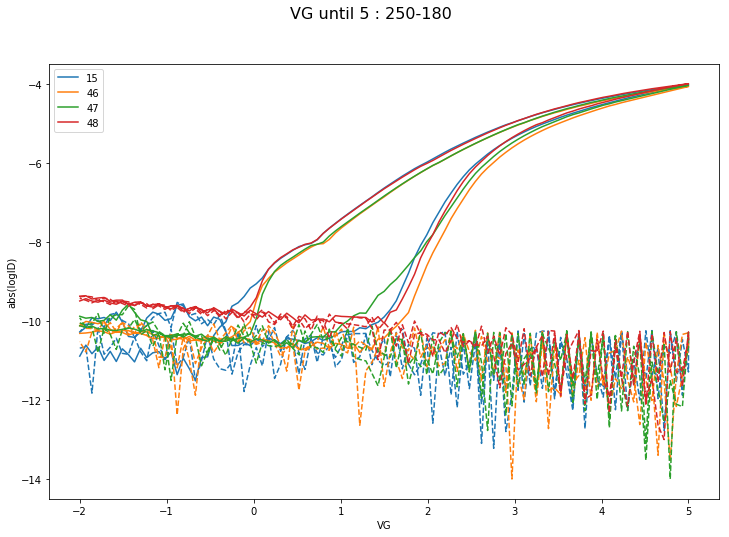

In [43]:
#@title Linear max(VG)=5 VD=5
fig, ax = plt.subplots(figsize=(12, 8))
fig.suptitle('VG until 5 : 250-180 ', fontsize=16)  
ax.set_ylabel('abs(logID)')
ax.set_xlabel('VG')
stab=six.loc[six.Curve=='sat']
for key, grp in stab.groupby(['number']): 
  y=np.log10(grp.absID)
  x=grp.VG
  y2=np.log10(grp.absIG)
  if max(x)<4:
    continue
    
  color = next(ax._get_lines.prop_cycler)['color']

  ax.plot(x,  y,  label=key, color=color)
  ax.plot(x, y2, label='',  color =color, linestyle='--')

plt.legend(loc='best')

plt.show() 